# Analyze the Model Output

In [1]:
import glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import xarray as xr
import scipy.stats as stats
import pandas as pd
import pickle
from IPython.display import HTML
import matplotlib.animation as animation

# Set the embed limit to a larger value
mpl.rcParams['animation.embed_limit'] = 30.0

In [2]:
tmp = xr.open_mfdataset('/scratch/nlg59/Output/Control_Feb/temp_1*') #units: deg K
uvel = xr.open_mfdataset('/scratch/nlg59/Output/Control_Feb/uvel_1*') # units: m/s
vvel = xr.open_mfdataset('/scratch/nlg59/Output/Control_Feb/vvel_1*') # units: m/s
geo = xr.open_mfdataset('/scratch/nlg59/Output/Control_Feb/geo_1*') # units: m2/s2
lnps = xr.open_mfdataset('/scratch/nlg59/Output/Control_Feb/lnps_1*') # units: ln of mb

Let's take a look at the data structure

In [3]:
tmp

<xarray.Dataset> Size: 6GB
Dimensions:  (time: 3660, lev: 26, lat: 64, lon: 128)
Coordinates:
  * time     (time) datetime64[ns] 29kB 1950-01-01 1950-01-02 ... 1960-01-08
  * lev      (lev) float64 208B 0.001123 0.005056 0.01163 ... 0.9705 0.9925
  * lat      (lat) float64 512B 87.86 85.1 82.31 79.53 ... -82.31 -85.1 -87.86
  * lon      (lon) float64 1kB 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
Data variables:
    t        (time, lev, lat, lon) float64 6GB dask.array<chunksize=(30, 26, 64, 128), meta=np.ndarray>

Now, let's see how the model captures the average surface temperature--in summer and in winter.

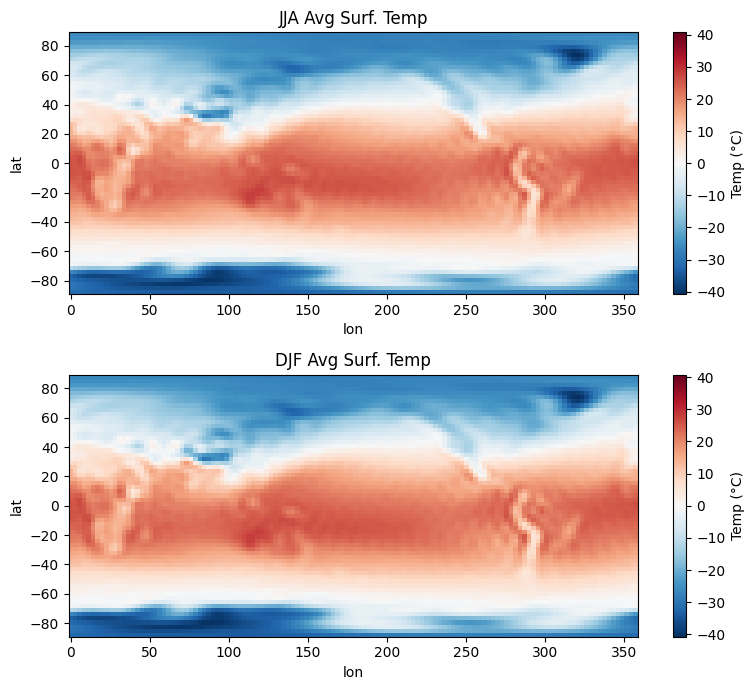

In [3]:
# select the surface layer
t_sfc = tmp.t.isel(lev=-1) - 273.15

# Group by season and calculate the mean for each season
seasonal_means = t_sfc.groupby('time.season').mean(dim='time')

# Extract JJA and DJF means
jja = seasonal_means.sel(season='JJA')
djf = seasonal_means.sel(season='DJF')

# Create the plot
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 7))

# Plot JJA
jja.plot(ax=ax1, cbar_kwargs={'label': 'Temp (°C)'})
ax1.set_title('JJA Avg Surf. Temp')

# Plot DJF
djf.plot(ax=ax2, cbar_kwargs={'label': 'Temp (°C)'})
ax2.set_title('DJF Avg Surf. Temp')

plt.tight_layout()

What do you notice about these maps?

Let's look at the data over time to confirm. Let's choose a grid cell near New Jersey.

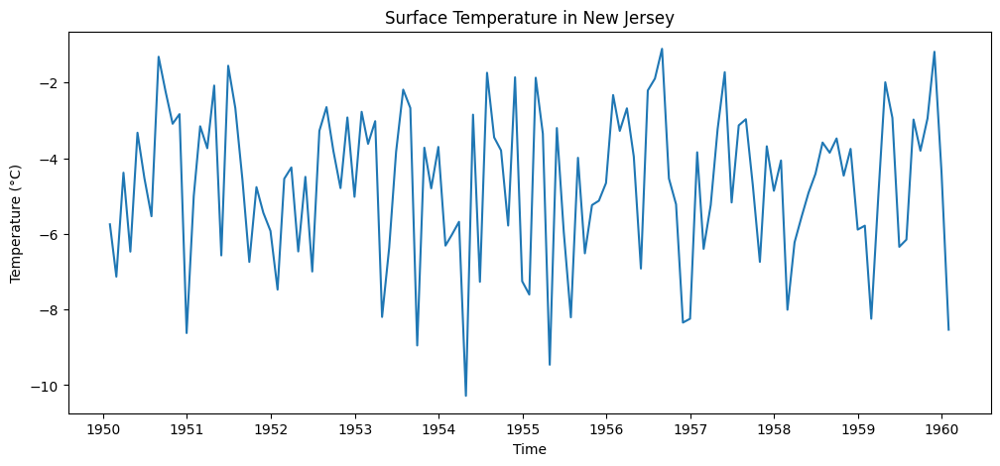

In [13]:
nj_temp = t_sfc.sel(lat=40, lon=360-74.4, method='nearest').resample(time='ME').mean()

# Plot the data
fig, ax = plt.subplots(figsize=(12, 5))
nj_temp.plot(ax=ax)
ax.set_xlabel('Time')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Surface Temperature in New Jersey')
plt.show()

What do you notice about the time series?

In [45]:
uvel

<xarray.Dataset> Size: 6GB
Dimensions:  (time: 3660, lev: 26, lat: 64, lon: 128)
Coordinates:
  * time     (time) datetime64[ns] 29kB 1950-01-01 1950-01-02 ... 1960-01-08
  * lev      (lev) float64 208B 0.001123 0.005056 0.01163 ... 0.9705 0.9925
  * lat      (lat) float64 512B 87.86 85.1 82.31 79.53 ... -82.31 -85.1 -87.86
  * lon      (lon) float64 1kB 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
Data variables:
    u        (time, lev, lat, lon) float64 6GB dask.array<chunksize=(30, 26, 64, 128), meta=np.ndarray>

Text(0.5, 1.0, 'Mean Zonal Winds')

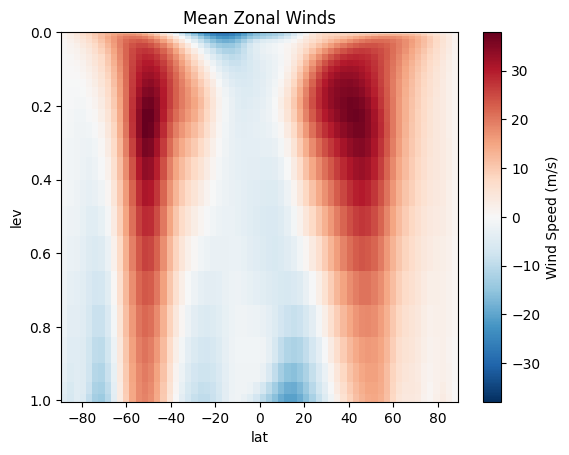

In [46]:
uvel.u.mean(['lon','time']).plot(cbar_kwargs={'label': 'Wind Speed (m/s)'})
plt.gca().invert_yaxis() # flip so 1000 mb is at the bottom

plt.title('Mean Zonal Winds')

What do you notice about the zonal winds?

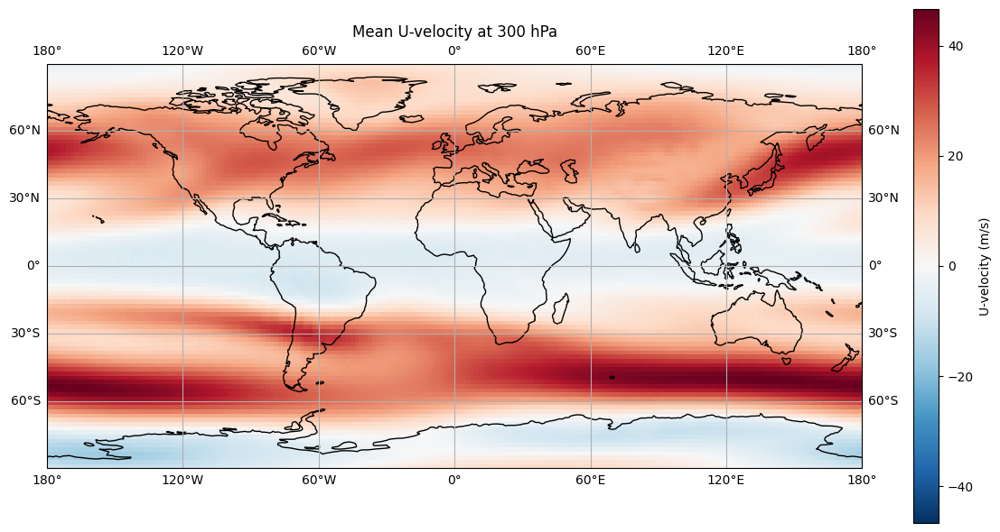

In [36]:
data = uvel.mean('time').sel(lev=300, method='nearest')

# Create the plot with Cartopy
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 6))

# Plot the data
data.plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'label': 'U-velocity (m/s)'})
# ax.contourf(data.lon, data.lat, data, transform=ccrs.PlateCarree(), cbar_kwargs={'label': 'U-velocity (m/s)'})

# Add coastlines, borders, and land features
ax.coastlines(edgecolor='gray')
# ax.add_feature(cfeature.BORDERS, edgecolor='gray')

# Optional: Add gridlines and labels
ax.gridlines(draw_labels=True)

plt.title('Mean U-velocity at 300 hPa')
plt.tight_layout()

What do you notice about the jet stream from this perspective?

Text(0.5, 1.0, 'Zonal mean Meridional Winds')

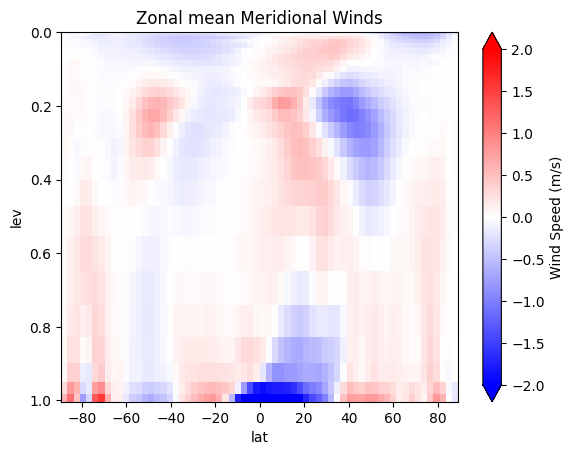

In [51]:
vvel.v.mean(['lon','time']).plot(vmin=-2, vmax=2, cmap='bwr', extend='both', cbar_kwargs={'label': 'Wind Speed (m/s)'})
plt.gca().invert_yaxis() # flip so 1000 mb is at the bottom

plt.title('Zonal-mean Meridional Winds')

Can you see any features or patterns in the v-component of the wind?

Text(0.5, 1.0, 'Zonal Mean of 500 hPa Geopotential Height')

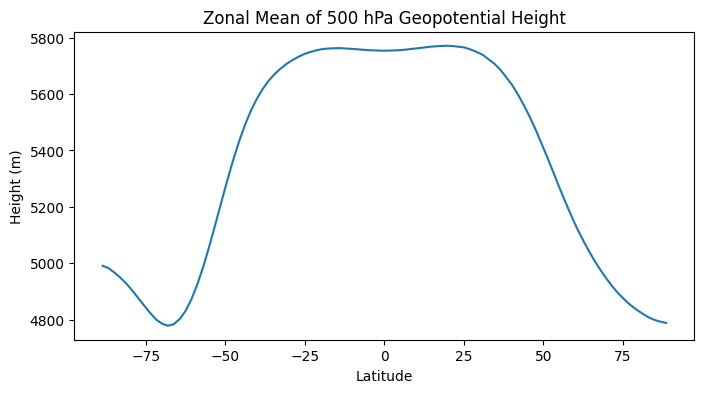

In [44]:
geo_ht = geo.geo.sel(lev=500.0).sel(time=slice('1950', '1954')) / 9.8
zonal_mean = geo_ht.mean(dim='lon').mean('time')

# Plot the zonal mean
fig, ax = plt.subplots(figsize=(8, 4))

# Plot the data
zonal_mean.plot(ax=ax)

# Set labels and title
ax.set_xlabel('Latitude')
ax.set_ylabel('Height (m)')
ax.set_title('Zonal Mean of 500 hPa Geopotential Height')

Text(0.5, 1.0, '500 hPa Geopotential Height on Day 240')

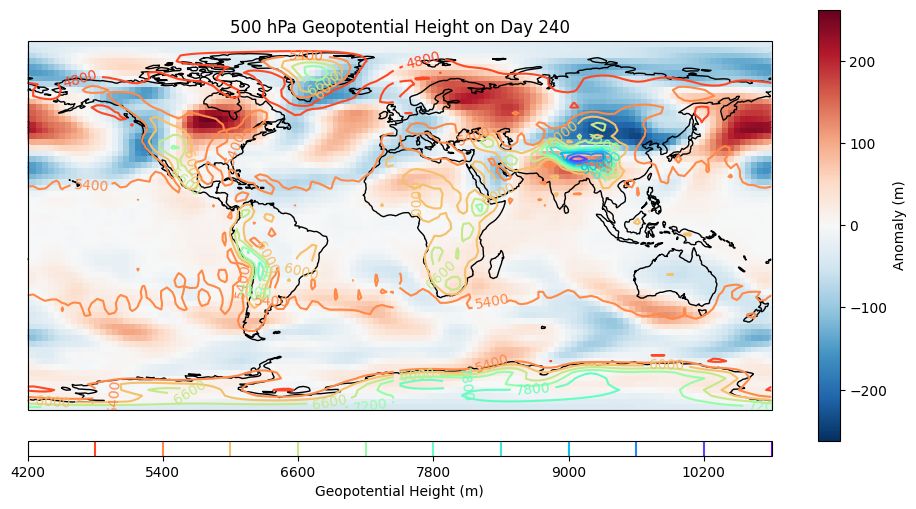

In [7]:
geo_ht = geo.geo.sel(lev=0.5, method='nearest') / 9.8
mean_geo = geo_ht.mean('time')

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Select a specific time to plot, for example, the first time step
day = 240
data_geo = geo_ht.isel(time=day)

# Add features to the map
ax.add_feature(cfeature.COASTLINE)

# Plot the contour and anomalies
contour = ax.contour(data_geo.lon, data_geo.lat, data_geo, levels=11, transform=ccrs.PlateCarree(), cmap='rainbow_r')
(data_geo - mean_geo).plot(ax=ax, cbar_kwargs={'shrink': 0.7, 'label': 'Anomaly (m)'})

# Add contour labels
ax.clabel(contour, inline=True, fontsize=10, fmt='%1.0f')  # Adjust formatting as needed

# Add a colorbar
cbar = plt.colorbar(contour, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('Geopotential Height (m)')

# Set title
ax.set_title(f'500 hPa Geopotential Height on Day {day}')

# Changes over time
Now, let's see how some of these fields change over time.

In [5]:
subsampled_data = t_sfc.isel(time=slice(0, 100, 1))

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})  # Adjust size as needed
# ax.coastlines()

# Initial plot to create the colorbar
initial_data = subsampled_data.isel(time=0).data
im = ax.imshow(initial_data, animated=True, cmap='RdBu', vmin=-30, vmax=30)
cbar = fig.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Temp (°C)')

def animate(i):
    im.set_array(subsampled_data.isel(time=i).data)
    ax.set_title(str(subsampled_data.time[i].values))
    return [im]

ani = animation.FuncAnimation(fig, animate, frames=len(subsampled_data.time), interval=200, blit=True)
plt.close(fig) # Close the figure to suppress the static image

animation_html = ani.to_jshtml()
HTML(f"<div style='width:1000px; height:600px; '>{animation_html}</div>")

Now, we'll look at anomaly maps of geopotential height instead.

In [8]:
subsampled_data = (geo_ht - mean_geo).isel(time=slice(0, 100, 1))

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})  # Adjust size as needed
# ax.coastlines()

# Initial plot to create the colorbar
initial_data = subsampled_data.isel(time=0).data
im = ax.imshow(initial_data, animated=True, cmap='RdBu', vmin=-300, vmax=300, transform=ccrs.PlateCarree())
cbar = fig.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Geopotential height anomaly (m)')

def animate(i):
    im.set_array(subsampled_data.isel(time=i).data)
    ax.set_title(str(subsampled_data.time[i].values))
    return [im]

ani = animation.FuncAnimation(fig, animate, frames=len(subsampled_data.time), interval=200, blit=True)
plt.close(fig) # Close the figure to suppress the static image

animation_html = ani.to_jshtml()
HTML(f"<div style='width:1000px; height:600px; '>{animation_html}</div>")